# ENCH 470 Drug Repurposing Project Logistic Regression
### The Bigfoots - Natalie Dame, Taylor deSilva, Madison McLaren
The following document are the results of the random forest model that was developed to classify drugs as active or inactive based on their molecular structures.

#### Citation for using scikit-learn
Scikit-learn: Machine Learning in Python, Pedregosa et al., JMLR 12, pp. 2825-2830, 2011

Using Random Forest from sklearn

#### Reasoning behind not using Validation with Random Forest
https://www.stat.berkeley.edu/~breiman/RandomForests/cc_home.htm#:~:text=In%20random%20forests%2C%20there%20is,sample%20from%20the%20original%20data.

Explains some things about Random Forests- one interesting thing to note is that a validation set is not needed for a random forest. This is because "Each tree is constructed using a different bootstrap sample from the original data. About one-third of the cases are left out of the bootstrap sample and not used in the construction of the kth tree"

## Import Libraries

In [2]:
import pandas as pd
import numpy as np
import rdkit
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Descriptors
from rdkit.Chem import rdFingerprintGenerator
from rdkit import DataStructs
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from sklearn import tree
from matplotlib import pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import export_graphviz
import dtreeviz as dt

## 5-HT Receptor Target - Ki Data
For this project, our goal was to develop a model that could classify drugs as based on their ability to inhibit the 5-HT receptor. To do this, the ChEMBL Database was used to find molecules that targeted the receptor. Specifically, molecules that had Ki values related to the 5-HT receptor were used. Ki is the inhibition constant that describes the likelihood of an inhibitor to dissociate from the target receptor. For our project, a lower value of Ki is desirable since it corresponds to a higher chance of inhibition.

In [3]:
#Extract values from CSV file
df5HT_Ki_ChEMBL = pd.read_csv('5HT_Ki.csv', sep = ';')
#Drop unwanted columns from the dataframe
df5HT_Ki_ChEMBL.drop(['Assay Organism','Document ChEMBL ID','Target Type','Source ID','Document Journal','BAO Format ID','Target ChEMBL ID','Target Name','Target Organism','Standard Relation','AlogP','Data Validity Comment','Uo Units','Comment','Molecule Max Phase','BAO Label','Assay Tissue ChEMBL ID','Assay Tissue Name','Assay Cell Type','Assay Subcellular Fraction', '#RO5 Violations','Compound Key','Source Description','Document Year','Cell ChEMBL ID','Properties','Assay Parameters','Assay Variant Accession','Assay Variant Mutation'], axis=1, inplace=True)
#Remove any duplicate molecules from the dataframe based on ChEMBL ID
df5HT_Ki_ChEMBL.drop_duplicates(subset=['Smiles'], keep=False, inplace=True)
#Remove any rows whose Ki values return NaN
df5HT_Ki_ChEMBL = df5HT_Ki_ChEMBL[df5HT_Ki_ChEMBL['Standard Value'].notna()]
#Reindex the Dataframe
df5HT_Ki_ChEMBL.reset_index(drop=True, inplace=True)
df5HT_Ki_ChEMBL

,Molecule ChEMBL ID,Molecule Name,Molecular Weight,Smiles,Standard Type,Standard Value,Standard Units,pChEMBL Value,Ligand Efficiency BEI,Ligand Efficiency LE,Ligand Efficiency LLE,Ligand Efficiency SEI,Potential Duplicate,Assay ChEMBL ID,Assay Description,Assay Type
0,CHEMBL110601,NaN,553.66,COc1ccc(NCC(=O)N2CCN(c3ccccc3C)CC2)cc1N1CCN(C)...,Ki,40.00,nM,7.40,16.91,0.32,4.88,14.42,0,CHEMBL616433,Affinity for 5-hydroxytryptamine 1B receptor s...,B
1,CHEMBL190190,NaN,400.53,Cc1ccc2c(OCCN3CCN(Cc4cccc5cc[nH]c45)CC3)cccc2n1,Ki,398.11,nM,6.40,15.98,0.29,2.18,14.42,0,CHEMBL839747,Displacement of [3H]5-HT from human 5-hydroxyt...,B
2,CHEMBL423127,NaN,451.61,CCCN(CCCCN1C(=O)CC(C)(C)CC1=O)C1CCc2ccc3[nH]cc...,Ki,115.00,nM,6.94,15.37,0.29,2.43,9.44,0,CHEMBL616870,In vitro binding affinity against cloned mamma...,B
3,CHEMBL197947,NaN,517.64,CCc1c(C(=O)N2CCc3cc4ccnc(N5CCN6CCC[C@@H]6C5)c4...,Ki,1.00,nM,9.00,17.39,0.32,4.66,11.07,0,CHEMBL883691,Mean binding affinity towards 5-hydroxytryptam...,B
4,CHEMBL79693,NaN,414.55,NC(=O)c1ccc2c(c1)CCOC2CCN1CCC(c2cccc3ccccc23)CC1,Ki,73.00,nM,7.14,17.22,0.31,2.32,12.84,0,CHEMBL616528,Binding affinity towards human 5-hydroxytrypta...,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
974,CHEMBL4871980,NaN,246.29,Fc1ccc(-c2n[nH]cc2N2CCNCC2)cc1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B
975,CHEMBL4856702,NaN,246.29,Fc1cccc(-c2n[nH]cc2N2CCNCC2)c1,Ki,1819.00,nM,5.74,23.31,0.44,4.11,13.06,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B
976,CHEMBL4869695,NaN,260.32,Fc1ccc(-c2n[nH]cc2N2CCCNCC2)cc1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B
977,CHEMBL4876193,NaN,256.35,Cc1cccc(-c2n[nH]cc2N2CCCNCC2)c1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B


## Develop Active and Inactive Molecule Dataframes
The next step is to split the dataset into Active and Inactive datasets. In order to do this, a threshold value for Ki must be chosen. Based off a literature source, we found that stated "The results also suggested that the threshold Ki value which could separate 5-HT uptake inhibitors with a probable long-lasting effect in vivo from those without the effect would be between 5 nM and 42 nM" (Ishigooka J, 1998). Thus, we decided to classify molecules with a Ki < 42 as active

#### Active Molecules

In [4]:
ActiveDrugs = df5HT_Ki_ChEMBL[(df5HT_Ki_ChEMBL["Standard Value"] < 42)]
ActiveDrugs.reset_index(drop=True, inplace=True)
ActiveDrugs

,Molecule ChEMBL ID,Molecule Name,Molecular Weight,Smiles,Standard Type,Standard Value,Standard Units,pChEMBL Value,Ligand Efficiency BEI,Ligand Efficiency LE,Ligand Efficiency LLE,Ligand Efficiency SEI,Potential Duplicate,Assay ChEMBL ID,Assay Description,Assay Type
0,CHEMBL110601,NaN,553.66,COc1ccc(NCC(=O)N2CCN(c3ccccc3C)CC2)cc1N1CCN(C)...,Ki,40.000,nM,7.40,16.91,0.32,4.88,14.42,0,CHEMBL616433,Affinity for 5-hydroxytryptamine 1B receptor s...,B
1,CHEMBL197947,NaN,517.64,CCc1c(C(=O)N2CCc3cc4ccnc(N5CCN6CCC[C@@H]6C5)c4...,Ki,1.000,nM,9.00,17.39,0.32,4.66,11.07,0,CHEMBL883691,Mean binding affinity towards 5-hydroxytryptam...,B
2,CHEMBL1242257,NaN,536.68,Cc1ccc2c(N3CCN(CCc4cccc5c4OCc4c(C(=O)NC6CCCC6)...,Ki,1.995,nM,8.70,NaN,NaN,NaN,NaN,0,CHEMBL1248646,Antagonist activity against human recombinant ...,F
3,CHEMBL372743,NaN,491.60,CCc1c(C(=O)N2CCc3cc4ccnc(N5CCN(C)CC5)c4cc32)cn...,Ki,1.000,nM,9.00,18.31,0.33,5.19,11.07,0,CHEMBL883691,Mean binding affinity towards 5-hydroxytryptam...,B
4,CHEMBL111316,NaN,229.28,NC(=O)c1ccc2[nH]c3c(c2c1)CC(N)CC3,Ki,10.000,nM,8.00,34.89,0.64,6.92,9.42,0,CHEMBL617321,Displacement of [3H]-5-HT from human 5-hydroxy...,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,CHEMBL340786,NaN,458.61,Cc1ccccc1N1CCN(C(=O)COc2ccc3cccc(N4CCN(C)CC4)c...,Ki,0.300,nM,9.52,20.76,0.38,5.89,24.26,0,CHEMBL616431,Receptor binding affinity for cloned human 5-h...,B
372,CHEMBL458199,NaN,458.65,Cc1ccc2c(OCCN3CCC(Cc4cccc(N5CCN(C)CC5)c4)CC3)c...,Ki,6.310,nM,8.20,17.88,0.33,3.57,25.75,0,CHEMBL1035841,Displacement of [3H]5HT from human 5HT1B recep...,B
373,CHEMBL330603,NaN,488.57,Cn1nnnc1-c1ccc2c(c1)c(C1CCN(CCN3CCNC3=O)CC1)cn...,Ki,20.000,nM,7.70,15.76,0.29,4.54,9.15,0,CHEMBL616962,Ability to displace [3H]5-CT (1.5 nM) from HeL...,B
374,CHEMBL431866,NaN,444.58,COc1ccc(NC(=O)N2CC=C(c3ccc4[nH]cc(C[C@H]5CCCN5...,Ki,4.200,nM,8.38,18.84,0.35,3.25,13.82,0,CHEMBL616534,Binding affinity towards cloned human 5-hydrox...,B


#### Inactive Molecules

In [5]:
InactiveDrugs = df5HT_Ki_ChEMBL[(df5HT_Ki_ChEMBL["Standard Value"] > 42)]
InactiveDrugs.reset_index(drop=True, inplace=True)
InactiveDrugs

,Molecule ChEMBL ID,Molecule Name,Molecular Weight,Smiles,Standard Type,Standard Value,Standard Units,pChEMBL Value,Ligand Efficiency BEI,Ligand Efficiency LE,Ligand Efficiency LLE,Ligand Efficiency SEI,Potential Duplicate,Assay ChEMBL ID,Assay Description,Assay Type
0,CHEMBL190190,NaN,400.53,Cc1ccc2c(OCCN3CCN(Cc4cccc5cc[nH]c45)CC3)cccc2n1,Ki,398.11,nM,6.40,15.98,0.29,2.18,14.42,0,CHEMBL839747,Displacement of [3H]5-HT from human 5-hydroxyt...,B
1,CHEMBL423127,NaN,451.61,CCCN(CCCCN1C(=O)CC(C)(C)CC1=O)C1CCc2ccc3[nH]cc...,Ki,115.00,nM,6.94,15.37,0.29,2.43,9.44,0,CHEMBL616870,In vitro binding affinity against cloned mamma...,B
2,CHEMBL79693,NaN,414.55,NC(=O)c1ccc2c(c1)CCOC2CCN1CCC(c2cccc3ccccc23)CC1,Ki,73.00,nM,7.14,17.22,0.31,2.32,12.84,0,CHEMBL616528,Binding affinity towards human 5-hydroxytrypta...,B
3,CHEMBL2205825,NaN,295.38,COc1ccc(CN2C3C4C5CC6C7C5C3C7C2(O)C64)cc1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL2215549,Binding affinity to 5-HT1B receptor,B
4,CHEMBL458001,NaN,500.00,O=C(Nc1cccc(Cn2ncc(N3CCNCC3)c(Cl)c2=O)c1)c1ccc...,Ki,524.81,nM,6.28,12.56,0.24,2.01,7.92,0,CHEMBL991387,Displacement of [3H]5HT from 5HT1B receptor ex...,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
598,CHEMBL4871980,NaN,246.29,Fc1ccc(-c2n[nH]cc2N2CCNCC2)cc1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B
599,CHEMBL4856702,NaN,246.29,Fc1cccc(-c2n[nH]cc2N2CCNCC2)c1,Ki,1819.00,nM,5.74,23.31,0.44,4.11,13.06,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B
600,CHEMBL4869695,NaN,260.32,Fc1ccc(-c2n[nH]cc2N2CCCNCC2)cc1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B
601,CHEMBL4876193,NaN,256.35,Cc1cccc(-c2n[nH]cc2N2CCCNCC2)c1,Ki,10000.00,nM,NaN,NaN,NaN,NaN,NaN,0,CHEMBL4828355,Binding affinity to 5HT1B receptor (unknown or...,B


## Random Forest Modelling
The next step was to develop the logistic regression model. As stated previously, the labels would be active (1) or inactive (0) and the features would be the fingerprints that are generated based on the molecular structure.

#### Develop Fingerprints for Active and Inactive Molecules

In [6]:
# Create list of Smiles Strings for Active and Inactive Drugs
ActiveMolecules_Smiles = ActiveDrugs['Smiles'].tolist()
InactiveMolecules_Smiles = InactiveDrugs['Smiles'].tolist()

# Make a list of Molecule Objects
ActiveMolecules = [Chem.MolFromSmiles(i) for i in ActiveMolecules_Smiles]
InactiveMolecules = [Chem.MolFromSmiles(i) for i in InactiveMolecules_Smiles]

# # Fingerprints for active molecules
ActiveFingerprints = rdFingerprintGenerator.GetFPs(ActiveMolecules)
# # Fingerprints for inactive molecules
InactiveFingerprints = rdFingerprintGenerator.GetFPs(InactiveMolecules)
# # Concatenate fingerprints
Fingerprints = ActiveFingerprints + InactiveFingerprints

#### Assign Classification

In [7]:
# 'Active' = 1
y_Active = np.ones(len(ActiveFingerprints))

# 'Inactive' = 0
y_Inactive = np.zeros(len(InactiveFingerprints))

# Classifier
y = np.concatenate([y_Active, y_Inactive])

# Random Forest 

## Splitting the data into a test and train set 

In [9]:
x_train, x_test, y_train, y_test = train_test_split(Fingerprints, y, test_size=0.3)

## Training the model - Using max depth = 3 for easier visualization for slides 

In [138]:
RF = RandomForestClassifier(n_estimators = 200, max_depth = 3, max_samples = 1.0, 
                            max_features = 1.0, oob_score = True, random_state=0)
CRF = RF.fit(x_train, y_train)

## Visualize the Decision Tree

In [11]:
# Import graphviz which is used to visualize RF results
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [140]:
# Generate image of the decision tree
plt.rcParams.update({'figure.figsize': (200, 150)})
plt.rcParams.update({'font.size': 14})
plt.figure(facecolor=('#c2e1daff'), linewidth=3)
tree.plot_tree(CRF.estimators_[1],
                class_names = ['Active', 'Inactive'], 
                filled = True, rounded = True)

[Text(0.5555555555555556, 0.875, 'x[1508] <= 0.5\ngini = 0.478\nsamples = 430\nvalue = [415, 270]\nclass = Active'),
 Text(0.3333333333333333, 0.625, 'x[1401] <= 0.5\ngini = 0.398\nsamples = 331\nvalue = [379, 143]\nclass = Active'),
 Text(0.2222222222222222, 0.375, 'x[1752] <= 0.5\ngini = 0.364\nsamples = 320\nvalue = [379, 119]\nclass = Active'),
 Text(0.1111111111111111, 0.125, 'gini = 0.274\nsamples = 277\nvalue = [353, 69]\nclass = Active'),
 Text(0.3333333333333333, 0.125, 'gini = 0.45\nsamples = 43\nvalue = [26, 50]\nclass = Inactive'),
 Text(0.4444444444444444, 0.375, 'gini = 0.0\nsamples = 11\nvalue = [0, 24]\nclass = Inactive'),
 Text(0.7777777777777778, 0.625, 'x[1765] <= 0.5\ngini = 0.344\nsamples = 99\nvalue = [36, 127]\nclass = Inactive'),
 Text(0.6666666666666666, 0.375, 'x[45] <= 0.5\ngini = 0.296\nsamples = 95\nvalue = [28, 127]\nclass = Inactive'),
 Text(0.5555555555555556, 0.125, 'gini = 0.23\nsamples = 87\nvalue = [19, 124]\nclass = Inactive'),
 Text(0.7777777777777

In [142]:
plt.savefig('2nd_Tree_in_Forest_where_Max_Depth_=_3.png')

<Figure size 20000x15000 with 0 Axes>

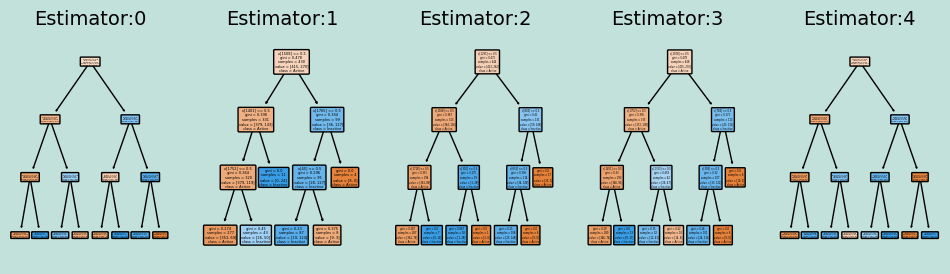

In [166]:
# Plot the results for 5 trees
fig, axes = plt.subplots(nrows= 1, ncols = 5, facecolor=('#c2e1daff'), figsize = (12, 3))
for index in range(0,5):
    tree.plot_tree(CRF.estimators_[index],
                  class_names = ['Active', 'Inactive'],
                  filled = True,
                  rounded = True,
                  ax = axes[index]);
    axes[index].set_title('Estimator:' + str(index), fontsize = 14)

## Visualizing the Tree Nodes

Finding a molecule that has an OnBit at place 1508 according to the 0th depth node

In [127]:
On1508 = []
On1401 = []
On1765 = []
On1752 = []
On45 = []
for i in range(len(ActiveMolecules)):
    if ActiveFingerprints[i][1508] > 0.5:
        On1508.append(ActiveMolecules[i])
    elif ActiveFingerprints[i][1401] > 0.5:
        On1401.append(ActiveMolecules[i])
    elif ActiveFingerprints[i][1765] > 0.5:
        On1765.append(ActiveMolecules[i])
    elif ActiveFingerprints[i][1752] > 0.5:
        On1752.append(ActiveMolecules[i])
    elif ActiveFingerprints[i][45] > 0.5:
        On45.append(ActiveMolecules[i])

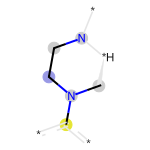

In [128]:
#visualizing the structure in position 1508
bi = {}
fp1508 = rdMolDescriptors.GetMorganFingerprintAsBitVect(On1508[1], radius=2, bitInfo=bi, nBits=2048)
Draw.DrawMorganBit(On1508[1], 1508 , bi, useSVG = True)

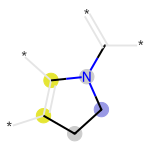

In [129]:
#visualizing the structure in position 1401
bi = {}
fp1401= rdMolDescriptors.GetMorganFingerprintAsBitVect(On1401[1], radius=2, bitInfo=bi, nBits=2048)
Draw.DrawMorganBit(On1401[1], 1401 , bi, useSVG = True)

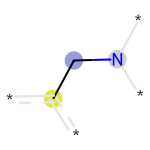

In [131]:
#visualizing the structure in position 1765
bi = {}
fp1765= rdMolDescriptors.GetMorganFingerprintAsBitVect(On1765[1], radius=2, bitInfo=bi, nBits=2048)
Draw.DrawMorganBit(On1765[1], 1765 , bi, useSVG = True)

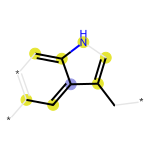

In [130]:
#visualizing the structure in position 1752
bi = {}
fp1752= rdMolDescriptors.GetMorganFingerprintAsBitVect(On1752[1], radius=2, bitInfo=bi, nBits=2048)
Draw.DrawMorganBit(On1752[1], 1752 , bi, useSVG = True)

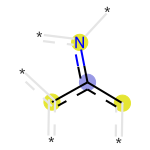

In [132]:
#visualizing the structure in position 45
bi = {}
fp45= rdMolDescriptors.GetMorganFingerprintAsBitVect(On45[1], radius=2, bitInfo=bi, nBits=2048)
Draw.DrawMorganBit(On45[1], 45 , bi, useSVG = True)

### Walking through the Tree with Active Molecule 23

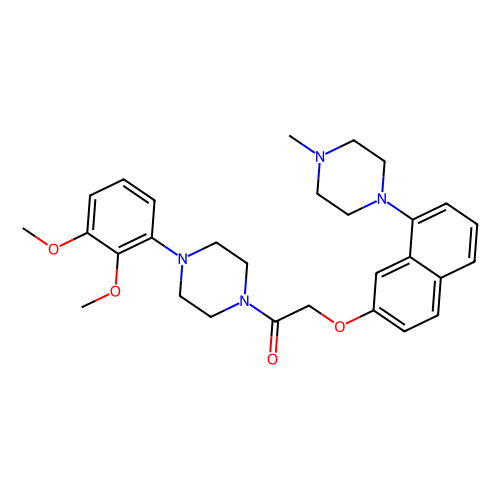

In [177]:
opts = Draw.MolDrawOptions()
opts.addBondIndices = True
Draw.MolToImage(ActiveMolecules[23],size=(500,500), dpi = 5000)

In [19]:
ActiveFingerprints[23][1508]

0

In [155]:
ActiveFingerprints[23][1401]

0

In [156]:
ActiveFingerprints[23][1765]

0

In [157]:
ActiveFingerprints[23][1752]

0

In [158]:
ActiveFingerprints[23][45]

0

# Re-evaluate where max depth = None for better accuracy 

In [152]:
RF_acc = RandomForestClassifier(n_estimators = 200, oob_score = True, random_state=0)
CRF_acc = RF_acc.fit(x_train, y_train)

In [309]:
y_pred = CRF_acc.predict(x_test)

#Return the mean accuracy on the given test data and labels using the built-in score method
CRFscore = CRF_acc.score(x_test,y_test) 
print('Score of Random Forest using built in score method: %.2f' %CRFscore)

Score of Random Forest using built in score method: 0.87


In [154]:
plt.figure(facecolor=('#c2e1daff'), linewidth=3)
tree.plot_tree(CRF_acc.estimators_[1],
                class_names = ['Active', 'Inactive'], 
                filled = True, rounded = True)

[Text(0.8355334444201632, 0.9791666666666666, 'x[1731] <= 0.5\ngini = 0.478\nsamples = 430\nvalue = [415, 270]\nclass = Active'),
 Text(0.7619759797494172, 0.9375, 'x[1002] <= 0.5\ngini = 0.445\nsamples = 337\nvalue = [359, 180]\nclass = Active'),
 Text(0.7104321459790209, 0.8958333333333334, 'x[2009] <= 0.5\ngini = 0.414\nsamples = 312\nvalue = [349, 144]\nclass = Active'),
 Text(0.6539645250582751, 0.8541666666666666, 'x[1895] <= 0.5\ngini = 0.387\nsamples = 295\nvalue = [341, 121]\nclass = Active'),
 Text(0.5876493298368298, 0.8125, 'x[1816] <= 0.5\ngini = 0.364\nsamples = 284\nvalue = [340, 107]\nclass = Active'),
 Text(0.48299096736596736, 0.7708333333333334, 'x[162] <= 0.5\ngini = 0.33\nsamples = 241\nvalue = [300, 79]\nclass = Active'),
 Text(0.4251893939393939, 0.7291666666666666, 'x[322] <= 0.5\ngini = 0.284\nsamples = 229\nvalue = [290, 60]\nclass = Active'),
 Text(0.33755827505827507, 0.6875, 'x[804] <= 0.5\ngini = 0.249\nsamples = 187\nvalue = [246, 42]\nclass = Active'),
 

# Using the model on approved drug molecules

In [179]:
Olanzapine_df = pd.read_csv('Olanzapine.csv', sep = ';')
Olanzapine = pd.DataFrame(Olanzapine_df.iloc[1]).T
Aripiprazole_df = pd.read_csv('Aripiprazole.csv', sep = ';')
Aripiprazole = pd.DataFrame(Aripiprazole_df.iloc[1]).T
Risperidone_df = pd.read_csv('Risperidone.csv', sep = ';')
Risperidone = pd.DataFrame(Risperidone_df.iloc[0]).T

ApprovedDrugs = pd.concat([Aripiprazole, Olanzapine, Risperidone], ignore_index=True)

ApprovedDrugs_smiles = ApprovedDrugs['Smiles'].tolist()

ApprovedDrugs_molecules = [Chem.MolFromSmiles(i) for i in ApprovedDrugs_smiles]
ApprovedDrugs_fingerprints = rdFingerprintGenerator.GetFPs(ApprovedDrugs_molecules)

y_approved = CRF_acc.predict(ApprovedDrugs_fingerprints)
print(y_approved)

[0. 0. 0.]


In [310]:
Class_RF = []
for i in range(len(y_approved)):
    if y_approved[i] > 0.5:
        Class_RF.append('Active')
    else:
        Class_RF.append('Inactive')
        
print('Aripiprazole is predicted to be:' ,Class_RF[0])
print('Olanzapine is predicted to be:' ,Class_RF[1])
print('Risperidone is predicted to be:' ,Class_RF[2])

Aripiprazole is predicted to be: Inactive
Olanzapine is predicted to be: Inactive
Risperidone is predicted to be: Inactive


# Gradient  Boosted


In [41]:
GB = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=0).fit(x_train, y_train)

In [42]:
GB_pred = GB.predict(x_test)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print(roc_auc)

0.8493677163401934


In [313]:
GBscore = GB.score(x_test, y_test)
print('Score of Gradient Boosted Random Forest using built in score method: %.2f' %GBscore)

Score of Gradient Boosted Random Forest using built in score method: 0.85


In [305]:
GB_approved = GB.predict(ApprovedDrugs_fingerprints)
Class = []
for i in range(len(GB_approved)):
    if GB_approved[i] > 0.5:
        Class.append('Active')
    else:
        Class.append('Inactive')
        
print('Aripiprazole is predicted to be:' ,Class[0])
print('Olanzapine is predicted to be:' ,Class[1])
print('Risperidone is predicted to be:' ,Class[2])

Aripiprazole is predicted to be: Inactive
Olanzapine is predicted to be: Inactive
Risperidone is predicted to be: Active


### Understanding the features in the Gradient Boosted Tree 

In [199]:
# plot decision tree
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_tree
import matplotlib.pyplot as plt
import dtreeviz.trees as dtreeviz

In [218]:
Importances = GB.feature_importances_
Importanceslist = Importances.tolist()
MostImportant_Weight = max(Importanceslist)
MostImportant_Feature = Importanceslist.index(MostImportant_Weight)
print(MostImportant_Weight)
print(MostImportant_Feature)

0.1879108869490194
1295


In [292]:
print('The weight of the most important feature in the gradient boosted model: %.2f'
      % MostImportant_Weight)
print('The location of the most important feature in the gradient boosted model: %.1f'
      % MostImportant_Feature)

The weight of the most important feature in the gradient boosted model: 0.19
The location of the most important feature in the gradient boosted model: 1295.0


In [ ]:
GBOn1295 = []
for i in range(len(ActiveMolecules)):
    if ActiveFingerprints[i][1295] > 0.5:
        GBOn1295.append(ActiveMolecules[i])

### Determining which feature had the heaviest impact for classifying Risperidone as Active 

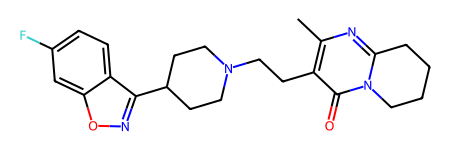

In [271]:
ApprovedDrugs_molecules[2]

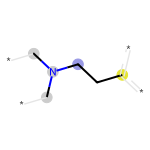

In [325]:
bi6 = {}
fp6 = rdMolDescriptors.GetMorganFingerprintAsBitVect(ApprovedDrugs_molecules[2], radius=2, bitInfo=bi6, nBits = 2048)
Risp_list = list(fp6.GetOnBits())
Draw.DrawMorganBit(ApprovedDrugs_molecules[2], 218, bi6, useSVG = True)

In [324]:
Importanceslist[Risp_list[5]]
Risp_list[5]

218

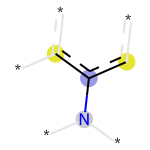

In [284]:
#visualizing the structure in position 1295
bi = {}
fp1401= rdMolDescriptors.GetMorganFingerprintAsBitVect(GBOn1295[0], radius=2, bitInfo=bi, nBits=2048)
Draw.DrawMorganBit(GBOn1295[0], 1295 , bi, useSVG = True)